## Importing required libraries

In [120]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import model_from_json
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from matplotlib.pyplot import figure
%matplotlib inline

### Loading the Model to make the predictions

In [2]:
# load json and create model
json_file = open('git_cnn_model.json', 'r')
loaded_model_json2 = json_file.read()
json_file.close()
Model = model_from_json(loaded_model_json2)
# load weights into new model
Model.load_weights("git_cnn_model.h5")
print("Loaded model from disk")
 

Loaded model from disk


### Image Generator to generate class indices

In [32]:
data_gen = ImageDataGenerator(
    rotation_range=20,
    shear_range=0.5, 
    zoom_range=0.4, 
    rescale=1./255,
    vertical_flip=True, 
    validation_split=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True) 

In [177]:
DATA_PATH = os.path.join(os.getcwd(),"Image_Datasets")

In [35]:
train_path = os.path.join(DATA_PATH,'output','train')

In [38]:
train_generator = data_gen.flow_from_directory(
        train_path,
        target_size=(224, 224), 
        batch_size=32,
        class_mode='categorical',
        color_mode='rgb', 
        shuffle=True,
        
        )

Found 12553 images belonging to 17 classes.


In [40]:
class_labels = train_generator.class_indices
class_labels

{'OTHER': 0,
 'animal': 1,
 'cartoon': 2,
 'chevron': 3,
 'floral': 4,
 'geometry': 5,
 'houndstooth': 6,
 'ikat': 7,
 'letter_numb': 8,
 'plain': 9,
 'polka dot': 10,
 'scales': 11,
 'skull': 12,
 'squares': 13,
 'stars': 14,
 'stripes': 15,
 'tribal': 16}

### Loading Test Image 1

In [123]:
test_image1 = image.load_img('C:\\Users\\shaan\\Downloads\\851505478.jpg', target_size = (224, 224))
test_image1 = image.img_to_array(test_image1)
test_image1 = test_image1/255.0
test_image1 = np.expand_dims(test_image1, axis = 0)

### Prediction for Test Image 1

In [43]:
prediction1 = Model.predict_classes(test_image1)


In [44]:
prediction_label1 = list(class_labels.keys())[prediction1[0]]
prediction_label1

'stripes'

### Plotting Test Image 1

In [45]:
test_image1 = cv2.imread('851505478.jpg',1)

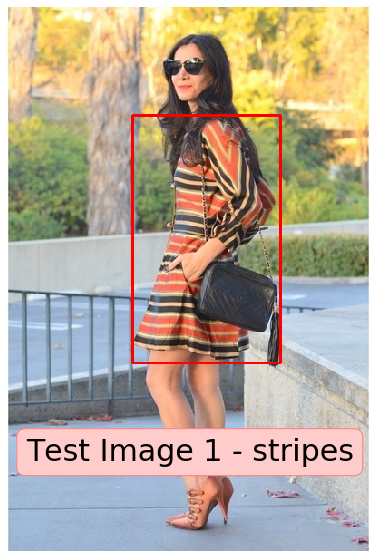

In [173]:
plt.figure(figsize = (16,10))
plt.imshow(cv2.cvtColor(test_image1,cv2.COLOR_BGR2RGB))
plt.text(20,500,'Test Image 1 - '+ prediction_label,size=30, bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1., 0.8, 0.8),
                   ))
plt.axis('off')
plt.show()

### Plotting similar dress pattern for Test Image 1 from the dataset

In [93]:
os.chdir (os.path.join(DATA_PATH,'output','val',prediction_label1))


In [95]:
similar_images1 = [img for img in os.listdir(os.path.join(DATA_PATH,'output','val',prediction_label1))]

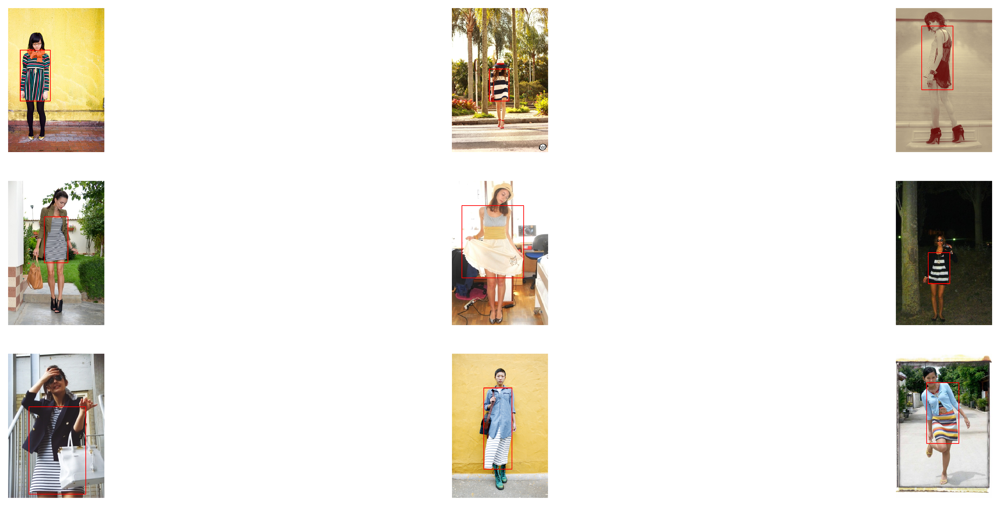

In [117]:
figure(num=None, figsize=(20, 8), dpi=360, facecolor='w', edgecolor='k')

for i,image in enumerate(similar_images1[1:10],start=1):
    image_array = cv2.imread(image,1)
    
    image_array = cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB)
    plt.subplot(3,3,i)
    plt.axis('off')
    plt.imshow(image_array, cmap=plt.get_cmap('gray'))
 
plt.show()

### Loading Test Image 2

In [124]:
test_image2 = image.load_img('C:\\Users\\shaan\\Downloads\\851505527.jpg', target_size = (224, 224))
test_image2 = image.img_to_array(test_image2)
test_image2 = test_image2/255.0
test_image2 = np.expand_dims(test_image2, axis = 0)

### Prediction for Test Image 2

In [125]:
prediction2 = Model.predict_classes(test_image2)


In [126]:
prediction_label2 = list(class_labels.keys())[prediction2[0]]
prediction_label2

'floral'

### Plotting Test Image 2

In [129]:
test_image2 = cv2.imread('C:\\Users\\shaan\\Downloads\\851505527.jpg',1)

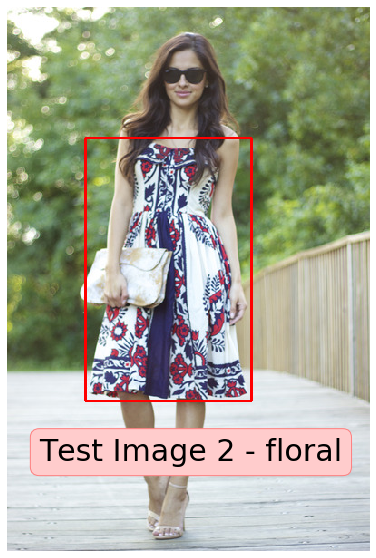

In [176]:
plt.figure(figsize = (16,10))
plt.imshow(cv2.cvtColor(test_image2,cv2.COLOR_BGR2RGB))
plt.text(35,500,'Test Image 2 - '+ prediction_label2,size=30, bbox=dict(boxstyle="round",
                   ec=(1., 0.5, 0.5),
                   fc=(1., 0.8, 0.8),
                   ))
plt.axis('off')
plt.show()

### Plotting similar dress pattern for Test Image 2 from the dataset

In [182]:
os.chdir (os.path.join('C:\\Users\\shaan\\Downloads\\Image_Datasets\\output\\val\\',prediction_label2))


In [183]:
similar_images2 = [img for img in os.listdir(os.getcwd())]

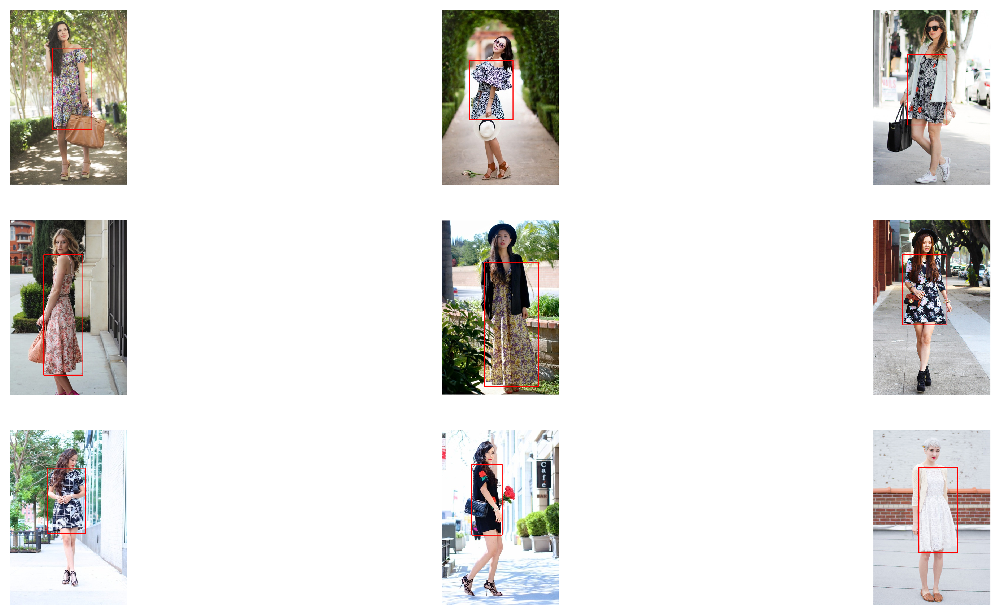

In [184]:
figure(num=None, figsize=(16, 8), dpi=360, facecolor='w', edgecolor='k')

for i,image in enumerate(similar_images2[1:10],start=1):
    image_array = cv2.imread(image,1)
    
    image_array = cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB)
    plt.subplot(3,3,i)
    plt.axis('off')
    plt.imshow(image_array, cmap=plt.get_cmap('gray'))
 
plt.show()